# Project 2: Predicting Healthcare Costs

## Imports / Initializations

In [1]:
#Import Libraries and dependencies

#To View and Analyze data
import numpy as np
import pandas as pd

#Matplotlib, Seaborn and Plotly for visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import plot, iplot, init_notebook_mode

#Linear Regression using Scikit-learn
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import r2_score, mean_squared_error

#Remove Warning Messages
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Initializing plot parameters
sns.set_style('darkgrid')
plt.rcParams['font.size'] = 14
#plt.rcParams['figure.figsize'] = (20 ,1)
plt.rcParams['figure.facecolor'] = '#00000000'
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['mathtext.fontset'] = 'custom'
plt.rcParams['mathtext.bf'] = 'Arial:bold'
plt.rcParams['mathtext.it'] = 'Arial:italic'

## Data Review

In [3]:
# Importing CSV produced by data_cleaning into DataFrame
df_healthcare_raw = pd.read_csv("Resources/2018_FYC.csv")

# Reviewing Dataframe
df_healthcare_raw.head()

,DUID,FAMSZE18,REGION18,ENDRFY18,AGE18X,SEX,RACEV2X,EDUCYR,HIDEG,ADBMI42,ADOFTB42,TTLP18X,UNINS18,TOTEXP18,TOTSLF18,TOTMCR18,TOTMCD18,TOTVA18,TOTPTR18,TOTOTH18
0,2290001,2,2,2018,27,2,1,16,4,21.4,3,32000,2,2368,225,0,2037,0,107,0
1,2290001,2,2,2018,25,1,1,17,4,30.6,3,0,2,2040,136,0,0,0,1904,0
2,2290002,6,2,2018,34,2,1,10,3,28.2,3,25000,2,173,74,0,0,0,99,0
3,2290002,6,2,2018,39,1,1,10,3,28.7,3,30000,2,0,0,0,0,0,0,0
4,2290002,6,2,2018,11,1,1,4,8,-1.0,-1,0,2,103,69,0,0,0,34,0


In [7]:
# Data Cleaning

# Renaming columns
df_healthcare_raw.columns = ['ID', 'Family_Size', 'Region', 'Year', 'Age', 'Sex', 'Race', 'Education_Level', 'Highest_Degree', 'BMI', 'Tobacco_Use', 'Total_Personal_Income', 'Uninsured_2018', 'Total_Expenditure', 'Exp_Pocket', 'Exp_Medicare', 'Total_Medicaid', 'Exp_VA', 'Total_Priv_Tri', 'Total_Other']
         
# Filtering data to just the adults
df_healthcare = df_healthcare_raw.loc[(df_healthcare_raw['Age'] > 20)]

# Filtering only for insured customers
df_healthcare = df_healthcare.loc[(df_healthcare['Uninsured_2018'] == 2)]

# Filtering for all valid family sizes
df_healthcare = df_healthcare.loc[(df_healthcare['Family_Size'] >= 0)]

# Filtering for all valid BMI 
df_healthcare = df_healthcare.loc[(df_healthcare['BMI'] > 5)]

# Filtering for Total_Expenditure outliers
df_healthcare = df_healthcare.loc[(df_healthcare['Total_Expenditure'] < 200000)]

# Filtering for applicable tobacco answers (1=Yes/2=No)
df_healthcare = df_healthcare.loc[(df_healthcare['Tobacco_Use'] > 0)]

# Removing unnecessary columns
df_healthcare.drop('Year', axis=1, inplace=True)
df_healthcare.drop('Uninsured_2018', axis=1, inplace=True)

df_healthcare = df_healthcare.set_index('ID')

# Reviewing Dataframe
df_healthcare.head(10)

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
ID,,,,,,,,,,,,,,,,,
2290001,2,2,27,2,1,16,4,21.4,3,32000,2368,225,0,2037,0,107,0
2290001,2,2,25,1,1,17,4,30.6,3,0,2040,136,0,0,0,1904,0
2290002,6,2,34,2,1,10,3,28.2,3,25000,173,74,0,0,0,99,0
2290002,6,2,39,1,1,10,3,28.7,3,30000,0,0,0,0,0,0,0
2290003,4,2,36,2,1,17,5,21.5,3,30217,535,232,0,0,0,303,0
2290005,5,2,30,1,1,14,3,28.3,3,31644,800,140,0,0,0,660,0
2290005,5,2,32,2,1,12,2,28.9,3,29244,5233,1550,0,0,0,3683,0
2290006,2,3,28,2,1,12,3,43.1,3,11000,0,0,0,0,0,0,0
2290007,2,3,60,1,1,11,1,21.9,3,5000,519,1,0,0,0,518,0


In [4]:
# Reviewing statistical summary of our dataset
df_healthcare.describe()

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
count,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000,15537.000000
mean,2.664800,2.702452,51.997490,1.542833,1.816760,13.380061,3.547982,28.721890,2.685332,42762.608998,8079.324773,993.697110,2684.781232,962.051039,278.415267,2901.716869,217.780395
std,1.494029,1.015186,17.521458,0.498178,2.336454,3.255420,1.811013,6.966278,0.684093,42142.439967,16137.799456,2823.478638,9489.541821,5760.362600,3092.468732,9527.021284,2193.035531
min,1.000000,1.000000,21.000000,1.000000,1.000000,-15.000000,-15.000000,5.300000,1.000000,-309948.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,37.000000,1.000000,1.000000,12.000000,3.000000,24.000000,3.000000,14040.000000,621.000000,39.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,3.000000,53.000000,2.000000,1.000000,14.000000,3.000000,27.500000,3.000000,31500.000000,2504.000000,305.000000,0.000000,0.000000,0.000000,251.000000,0.000000
75%,4.000000,3.000000,66.000000,2.000000,1.000000,16.000000,4.000000,32.200000,3.000000,58000.000000,8046.000000,1003.000000,705.000000,0.000000,0.000000,1829.000000,0.000000
max,16.000000,4.000000,85.000000,2.000000,12.000000,17.000000,7.000000,71.100000,3.000000,318505.000000,198092.000000,156602.000000,166729.000000,198088.000000,121108.000000,191097.000000,125175.000000


In [5]:
# Examining Dataframe values & columns
df_healthcare.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15537 entries, 2290001 to 2329687
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Family_Size            15537 non-null  int64  
 1   Region                 15537 non-null  int64  
 2   Age                    15537 non-null  int64  
 3   Sex                    15537 non-null  int64  
 4   Race                   15537 non-null  int64  
 5   Education_Level        15537 non-null  int64  
 6   Highest_Degree         15537 non-null  int64  
 7   BMI                    15537 non-null  float64
 8   Tobacco_Use            15537 non-null  int64  
 9   Total_Personal_Income  15537 non-null  int64  
 10  Total_Expenditure      15537 non-null  int64  
 11  Exp_Pocket             15537 non-null  int64  
 12  Exp_Medicare           15537 non-null  int64  
 13  Total_Medicaid         15537 non-null  int64  
 14  Exp_VA                 15537 non-null  int64  

In [6]:
# Checking for null values in our data
df_healthcare.isnull().sum()

Family_Size              0
Region                   0
Age                      0
Sex                      0
Race                     0
Education_Level          0
Highest_Degree           0
BMI                      0
Tobacco_Use              0
Total_Personal_Income    0
Total_Expenditure        0
Exp_Pocket               0
Exp_Medicare             0
Total_Medicaid           0
Exp_VA                   0
Total_Priv_Tri           0
Total_Other              0
dtype: int64

## CHECKING DISTRIBUTION OF VARIABLES

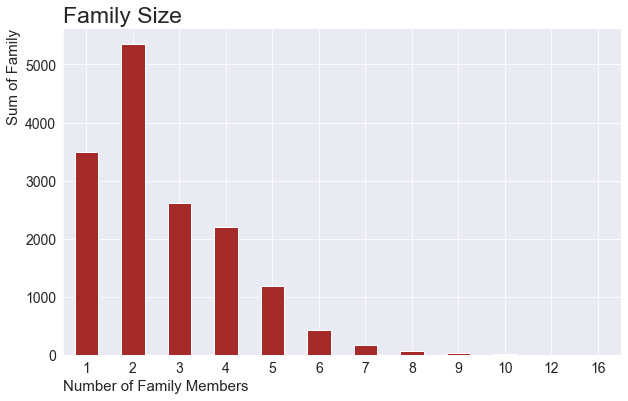

In [7]:
# Distribution of children
# Plotting children counts using bar plot
df_healthcare.Family_Size.value_counts().sort_index().plot(kind = 'bar', figsize = (10, 6), color = "brown")

# Adjusting plot parameters
plt.title('Family Size', fontdict = {'fontsize': 23}, loc = 'left')
plt.xticks(rotation = 0, fontsize = 14)
plt.yticks(fontsize = 14)
plt.xlabel('Number of Family Members', fontsize = 15, loc = 'left')
plt.ylabel('Sum of Family', fontsize = 15, loc = 'top')
sns.despine()
plt.show()

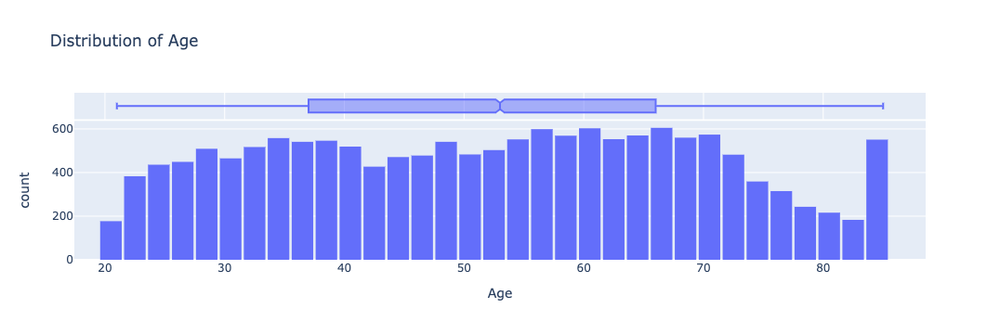

In [8]:
#Lets look at age distribution in our dataset
fig = px.histogram(df_healthcare, 
                   x='Age', 
                   marginal='box',
                   nbins=47,
                   title='Distribution of Age')
fig.update_layout(bargap=0.1)

# Displaying plot
fig.show()

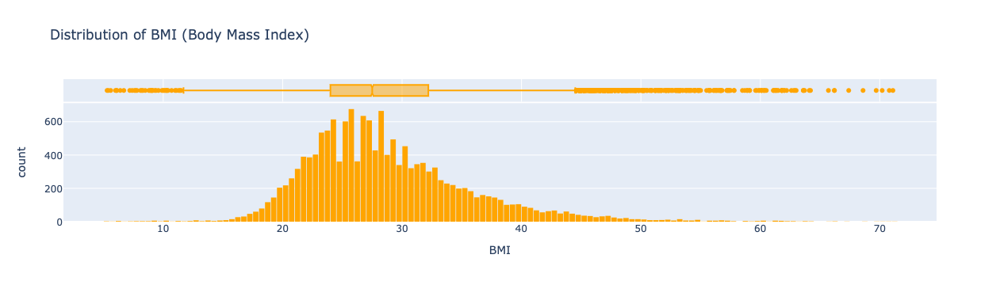

In [9]:
# Lets look at BMI distribution in dataset. Normal BMI is in the range 18.5 to 24.9.
fig = px.histogram(df_healthcare, 
                   x='BMI', 
                   marginal='box', 
                   color_discrete_sequence=['orange'], 
                   title='Distribution of BMI (Body Mass Index)')
fig.update_layout(bargap=0.1)
fig.show()

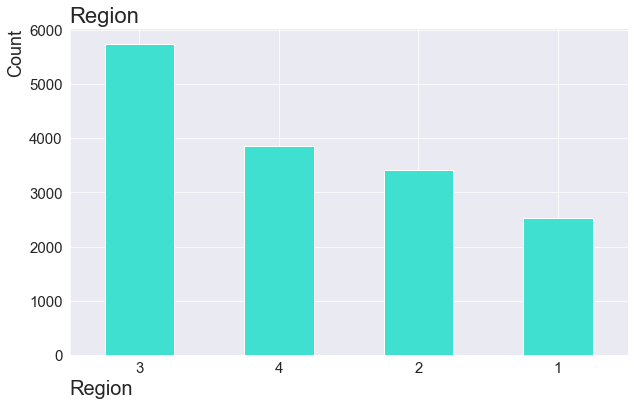

In [10]:
# Distribution of regions
df_healthcare.Region.value_counts().plot(kind = 'bar', figsize = (10, 6), color = "turquoise")
plt.title('Region', fontdict = {'fontsize': 22, 'fontweight': 'medium'}, loc = 'left')
plt.xticks(rotation = 0, fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Region', fontsize = 20, loc = 'left')
plt.ylabel('Count', fontsize = 18, loc = 'top')
sns.despine()
plt.show()

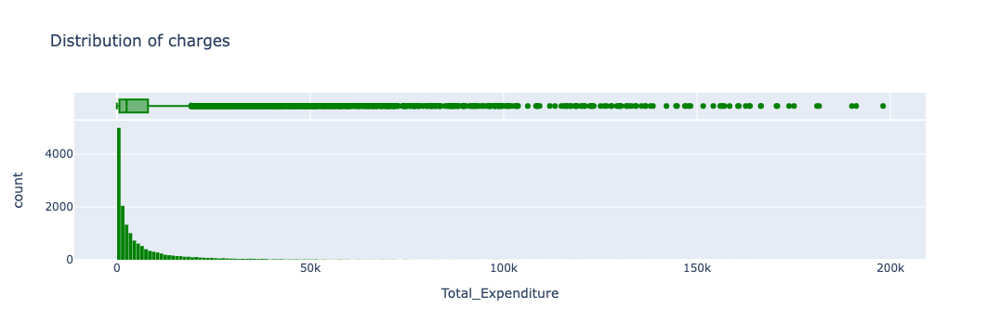

In [11]:
# Lets look at Total_Expenditure(Charges) distribution in dataset

fig = px.histogram(df_healthcare, 
                   x='Total_Expenditure', 
                   marginal='box', 
                   color_discrete_sequence=['green'], 
                   title='Distribution of charges')
fig.update_layout(bargap=0.1)
fig.show()

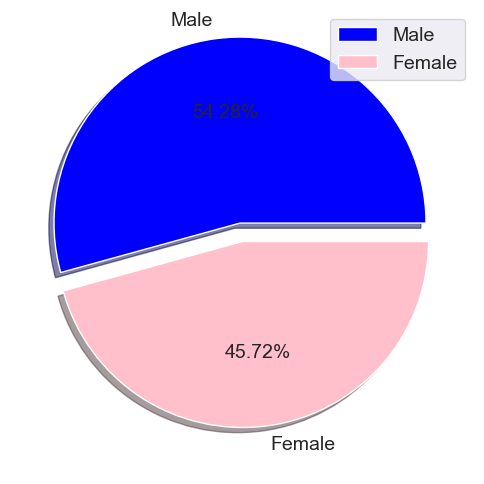

In [12]:
# Gender Proportion
count = df_healthcare.Sex.value_counts()
count

# Creating Pie Chart piechart
labels = ['Male', 'Female']
explode = [0.1, 0]
colors = ['blue', 'pink']

plt.figure(figsize= (6,9), dpi =100,facecolor='white')
plt.pie(count, explode=[0.1, 0], labels= labels, colors= colors, autopct='%0.02f%%', shadow=True)
plt.legend()


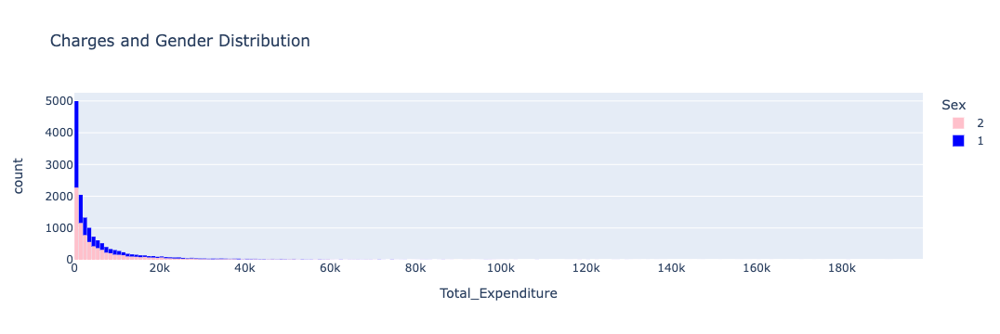

In [13]:
# Looking at distribution of charges by gender
fig = px.histogram(df_healthcare,
                   x = 'Total_Expenditure',
                   color = 'Sex',
                   color_discrete_sequence = ["pink","blue"],
                   title = 'Charges and Gender Distribution'
               
)
fig.update_layout(bargap=0.1)
fig.show()

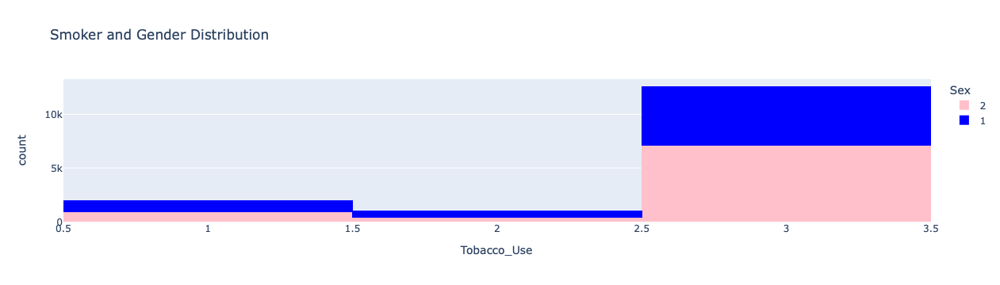

In [14]:
# Distribution of smokers and gender
px.histogram(df_healthcare, x='Tobacco_Use', color='Sex', color_discrete_sequence=["pink","blue"], title='Smoker and Gender Distribution')

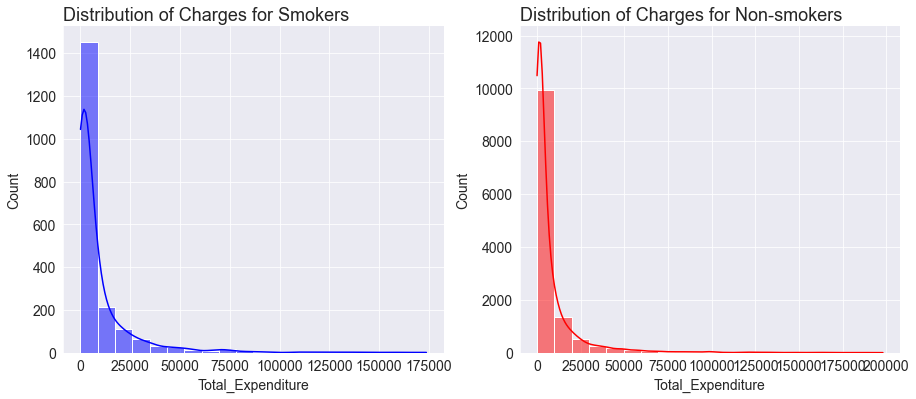

In [15]:
# Distribution of charges for smokers
# Creating plot
fig = plt.figure(figsize = (15, 6))

# Adding subplot
ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Tobacco_Use == 0|1)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Smokers', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Tobacco_Use == 3)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Non-smokers', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

# Displaying plot
plt.show()

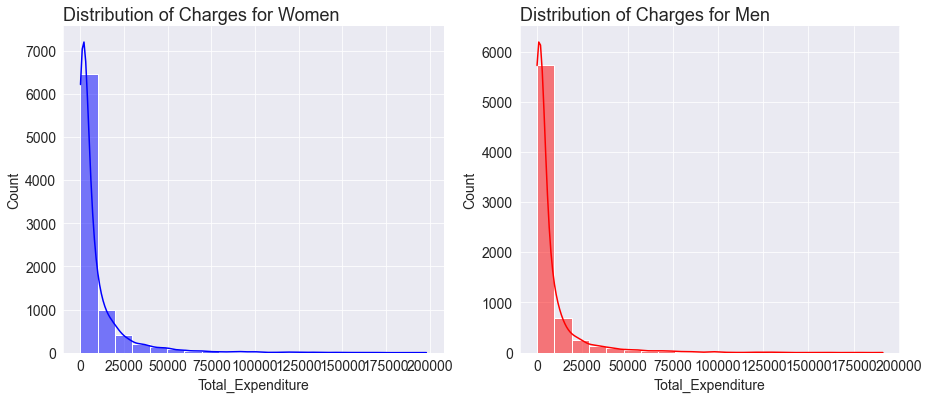

In [16]:
# Distribution of charges for gender
# Creating Plot
fig = plt.figure(figsize = (15, 6))

# Adding subplot
ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Sex == 2)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Women', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Sex == 1)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Men', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

# Displaying plot
plt.show()

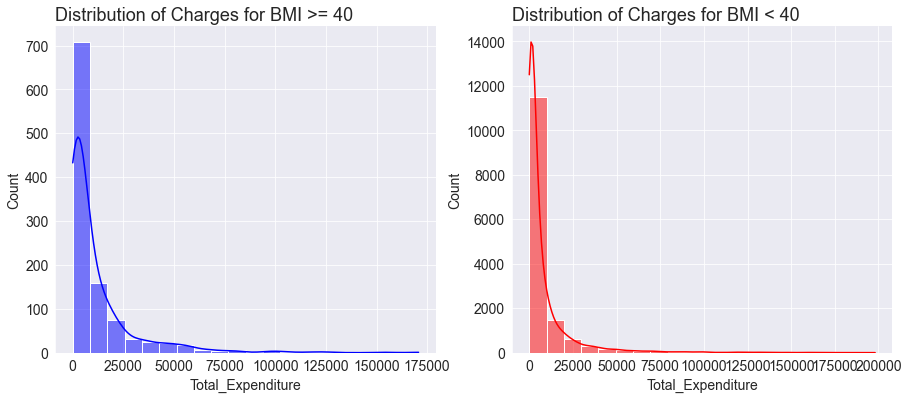

In [17]:
# Distribution of charges for bmi

fig = plt.figure(figsize = (15, 6))

ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.BMI >= 40)]['Total_Expenditure'], color ="blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for BMI >= 40', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.BMI < 40)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for BMI < 40', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

plt.show()

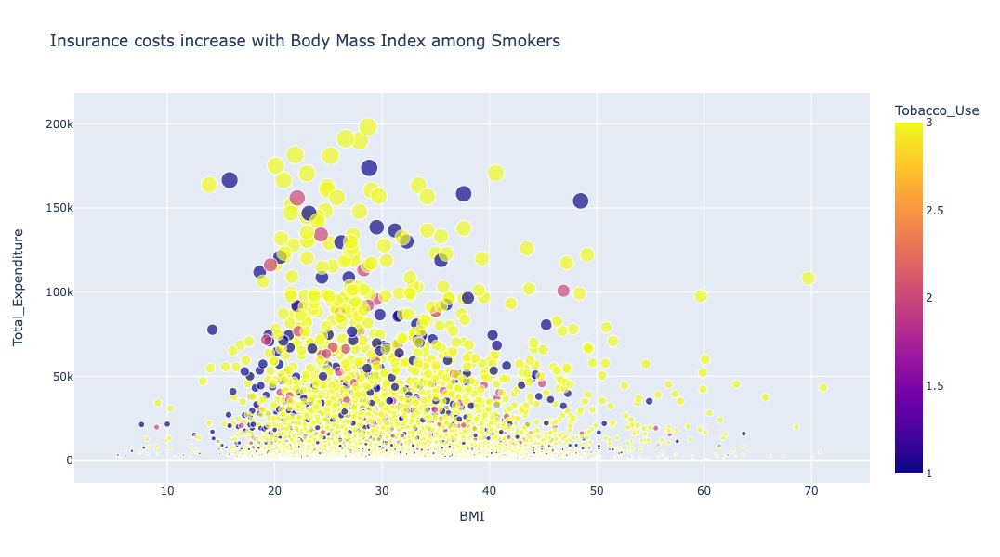

In [18]:
# Distribution of charges for bmi for smoker and non smokers
fig = px.scatter(df_healthcare, x='BMI', y='Total_Expenditure', color='Tobacco_Use', size='Total_Expenditure',
                 title="Insurance costs increase with Body Mass Index among Smokers",
                 color_discrete_sequence=['#B14B51','#B7A294'],height=600)
fig.show()

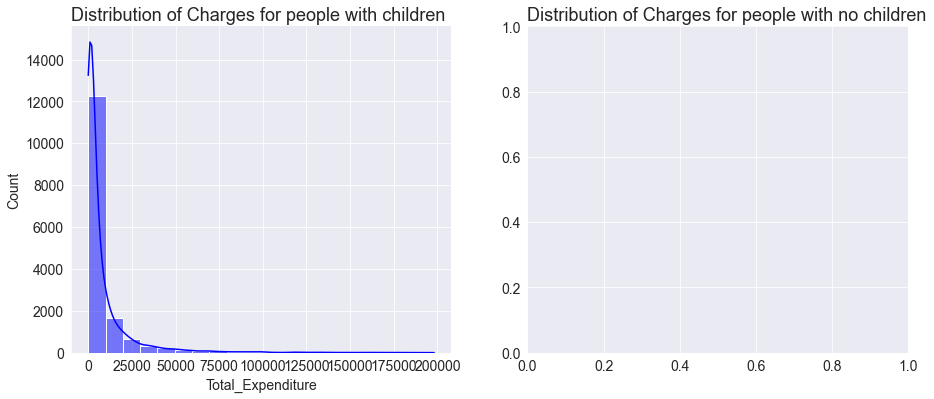

In [19]:
# Distribution of charges for children

fig = plt.figure(figsize = (15, 6))

ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Family_Size != 0)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for people with children', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Family_Size == 0)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for people with no children', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

plt.show()

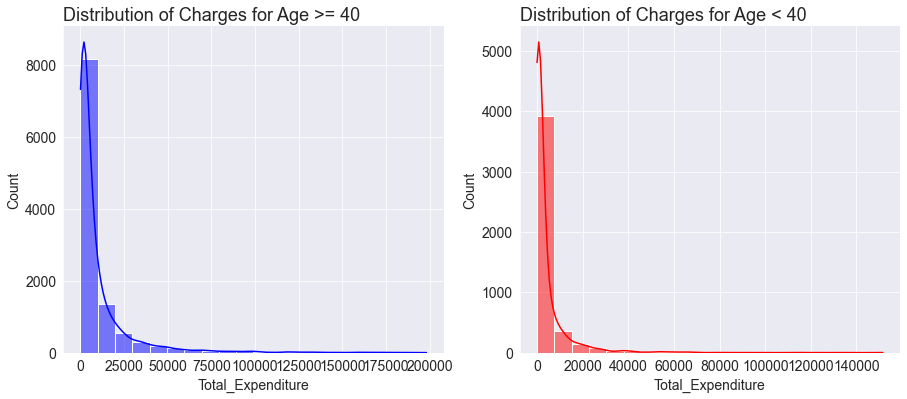

In [20]:
# Distribution of charges for smokers

fig = plt.figure(figsize = (15, 6))

ax = fig.add_subplot(121)
sns.histplot(df_healthcare[(df_healthcare.Age >= 40)]['Total_Expenditure'], color = "blue", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Age >= 40', fontdict = {'fontsize': 18}, loc = 'left')

ax = fig.add_subplot(122)
sns.histplot(df_healthcare[(df_healthcare.Age < 40)]['Total_Expenditure'], color = "red", ax = ax, kde = True, bins = 20)
ax.set_title('Distribution of Charges for Age < 40', fontdict = {'fontsize': 18}, loc = 'left')

sns.despine()

plt.show()

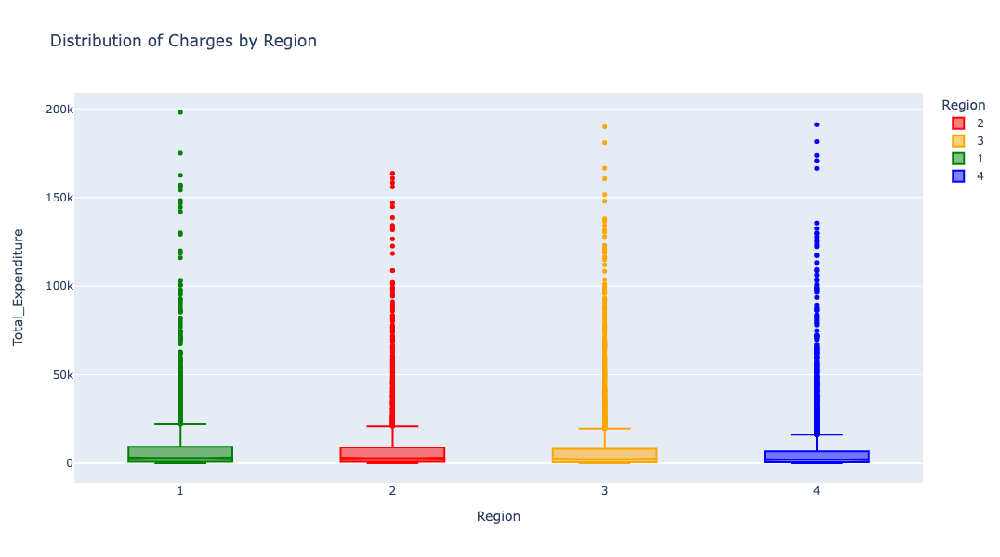

In [21]:
# looking at distribution of charges accross regions
fig = px.box(df_healthcare, x="Region", y="Total_Expenditure", color="Region", 
             notched=True, points="outliers", height=600,
             title="Distribution of Charges by Region",
             color_discrete_sequence=['red', 'orange', 'green', 'blue'])
fig.update_traces(marker_size=5)
fig.show()


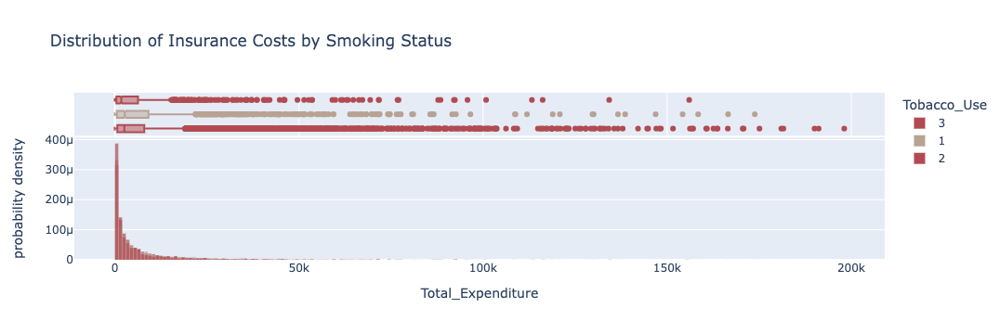

In [22]:
# Distribution of charges by smoking status
fig=px.histogram(df_healthcare, x='Total_Expenditure', color='Tobacco_Use', opacity=0.7, barmode='overlay',
                 histnorm='probability density', marginal='box', 
                 title="Distribution of Insurance Costs by Smoking Status",
                 color_discrete_sequence=['#B14B51','#B7A294']) 
fig.update_layout(bargap=0.1)
fig.show()

# Visualizations

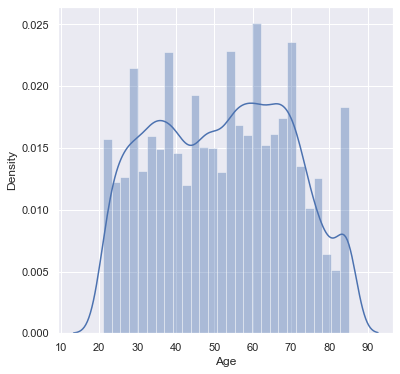

In [23]:
#distribution of age value column(what age group predominant in our data)
sns.set()
plt.figure(figsize=(6,6))
sns.distplot(df_healthcare["Age"])
plt.show()
#this density plot shows us that we have more sample of group beloning to age 22, 31, 42, 55, 65, 85

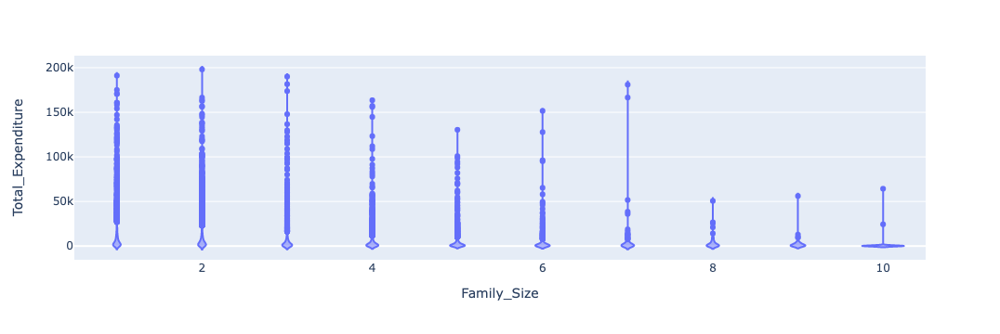

In [24]:
px.violin(df_healthcare[(df_healthcare.Family_Size <=10)], x='Family_Size', y='Total_Expenditure')# here we can see not there is not a lot of coorelation between #of children and amoumt of charge

In [25]:
df_healthcare["Family_Size"].value_counts()#3751 samples out of data have 1 child

2     5350
1     3492
3     2609
4     2203
5     1180
6      432
7      166
8       60
9       26
10      16
16       2
12       1
Name: Family_Size, dtype: int64

<AxesSubplot:xlabel='Sex', ylabel='Total_Expenditure'>

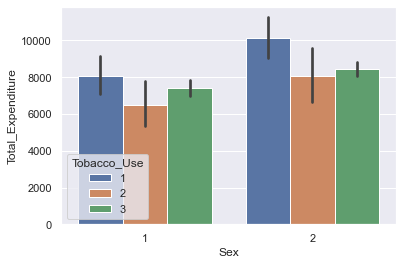

In [26]:
sns.barplot(data = df_healthcare,x = 'Sex',y = 'Total_Expenditure', hue = "Tobacco_Use")

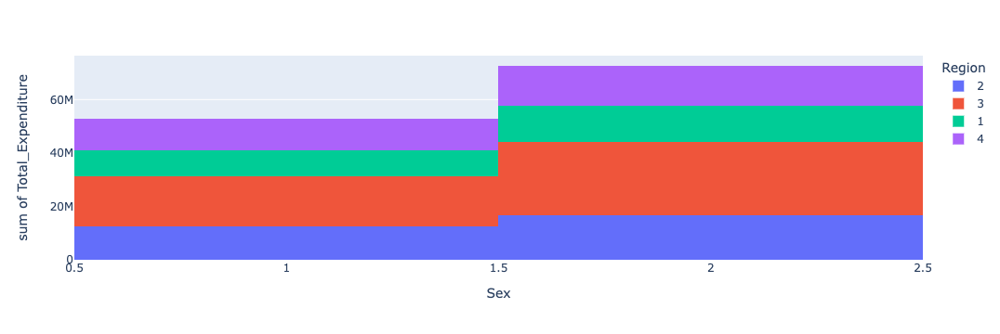

In [27]:
px.histogram(df_healthcare,x='Sex',y = 'Total_Expenditure', color = 'Region')

# Correlation

As you can tell from the analysis, the values in some columns are more closely related to the values in "charges" compared to other columns. E.g. "age" and "charges" seem to grow together, whereas "bmi" and "charges" don't.

This relationship is often expressed numerically using a measure called the correlation coefficient, which can be computed using the .corr method of a Pandas series.

In [28]:
df_healthcare.Total_Expenditure.corr(df_healthcare.Age)

0.21430044262737324

In [29]:
df_healthcare.Total_Expenditure.corr(df_healthcare.BMI)

0.0675659265313945

In [30]:
df_healthcare.Family_Size.corr(df_healthcare.Total_Expenditure)

-0.12712633190535924

In [31]:
df_healthcare.corr()

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
Family_Size,1.000000,0.063036,-0.358729,0.022232,0.047549,-0.070718,-0.058072,0.015840,0.039437,-0.030688,-0.127126,-0.095342,-0.146673,-0.028933,-0.043650,-0.004341,-0.023199
Region,0.063036,1.000000,-0.013930,0.004393,0.079155,-0.038524,-0.024811,-0.038213,0.042290,-0.006208,-0.042173,-0.003644,-0.030880,-0.032908,-0.004892,-0.018521,0.001483
Age,-0.358729,-0.013930,1.000000,-0.005035,-0.072562,-0.104937,-0.060600,-0.033877,0.064782,-0.009058,0.214300,0.149029,0.289551,0.002947,0.071193,-0.007349,0.057637
Sex,0.022232,0.004393,-0.005035,1.000000,0.021591,0.004746,0.020284,0.030814,0.083841,-0.173611,0.035835,0.025235,0.010115,0.056083,-0.070416,0.031219,-0.000417
Race,0.047549,0.079155,-0.072562,0.021591,1.000000,-0.010290,-0.018663,-0.036498,-0.000196,-0.033269,-0.037363,-0.043884,-0.024411,0.008949,-0.013101,-0.028689,0.003878
Education_Level,-0.070718,-0.038524,-0.104937,0.004746,-0.010290,1.000000,0.655448,-0.067571,0.137176,0.338459,-0.021208,0.052164,-0.076539,-0.095246,-0.005619,0.085815,-0.008139
Highest_Degree,-0.058072,-0.024811,-0.060600,0.020284,-0.018663,0.655448,1.000000,-0.034078,0.126202,0.262233,-0.015450,0.040326,-0.056645,-0.082894,0.003821,0.068130,-0.004882
BMI,0.015840,-0.038213,-0.033877,0.030814,-0.036498,-0.067571,-0.034078,1.000000,0.023354,-0.058403,0.067566,-0.005158,0.026341,0.055276,0.012976,0.047851,0.009484
Tobacco_Use,0.039437,0.042290,0.064782,0.083841,-0.000196,0.137176,0.126202,0.023354,1.000000,0.114391,-0.016294,0.041998,-0.000274,-0.070114,-0.025311,0.013113,-0.007915
Total_Personal_Income,-0.030688,-0.006208,-0.009058,-0.173611,-0.033269,0.338459,0.262233,-0.058403,0.114391,1.000000,-0.042852,0.077552,-0.097673,-0.122640,-0.025804,0.089434,-0.025940


Here's how correlation coefficients can be interpreted

Strength: The greater the absolute value of the correlation coefficient, the stronger the relationship.

The extreme values of -1 and 1 indicate a perfectly linear relationship where a change in one variable is accompanied by a perfectly consistent change in the other. For these relationships, all of the data points fall on a line. In practice, you won’t see either type of perfect relationship.

A coefficient of zero represents no linear relationship. As one variable increases, there is no tendency in the other variable to either increase or decrease.

When the value is in-between 0 and +1/-1, there is a relationship, but the points don’t all fall on a line. As r approaches -1 or 1, the strength of the relationship increases and the data points tend to fall closer to a line.

Direction: The sign of the correlation coefficient represents the direction of the relationship.

Positive coefficients indicate that when the value of one variable increases, the value of the other variable also tends to increase. Positive relationships produce an upward slope on a scatterplot.

Negative coefficients represent cases when the value of one variable increases, the value of the other variable tends to decrease. Negative relationships produce a downward slope.

Pandas dataframes also provide a .corr method to compute the correlation coefficients between all pairs of numeric columns.

In [32]:
corr_healthcare_df = df_healthcare.drop(columns=[
    "Race", "Total_Other", "Exp_VA", "Total_Medicaid", 
    "Exp_Medicare", "Total_Priv_Tri", "Exp_Pocket", 
    "Total_Personal_Income", "Highest_Degree", "Education_Level"], 
                                        axis=1
                                       )

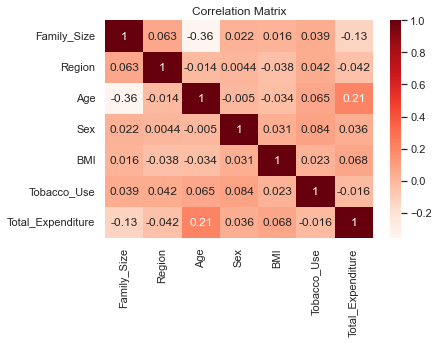

In [33]:
sns.heatmap(corr_healthcare_df.corr(), cmap='Reds', annot=True)
plt.title('Correlation Matrix');

In [34]:
corr2_healthcare_df = df_healthcare.drop(columns=["Family_Size", "BMI", "Age","Race", "Sex", 
                                                  "Tobacco_Use", "Region", "Total_Other", "Exp_VA", "Total_Medicaid", 
                                                    "Exp_Medicare", "Total_Priv_Tri", "Exp_Pocket", ])

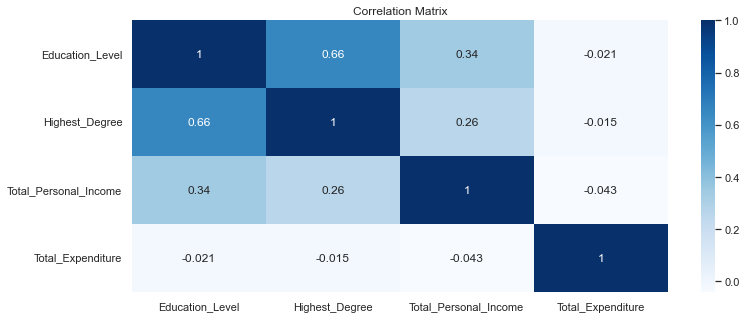

In [35]:
plt.subplots(figsize=(12, 5))
sns.heatmap(corr2_healthcare_df.corr(), cmap='Blues', annot=True)
plt.title('Correlation Matrix');

## Linear Regression using Scikit-learn for Non Smokers

Let's try to find a way of estimating the value of "charges" using the value of "age" for non-smokers. First, let's create a data frame containing just the data for non-smokers.

In [36]:
non_smoker_df = df_healthcare[df_healthcare.Tobacco_Use == 3 ]

In [37]:
non_smoker_df

,Family_Size,Region,Age,Sex,Race,Education_Level,Highest_Degree,BMI,Tobacco_Use,Total_Personal_Income,Total_Expenditure,Exp_Pocket,Exp_Medicare,Total_Medicaid,Exp_VA,Total_Priv_Tri,Total_Other
ID,,,,,,,,,,,,,,,,,
2290001,2,2,27,2,1,16,4,21.4,3,32000,2368,225,0,2037,0,107,0
2290001,2,2,25,1,1,17,4,30.6,3,0,2040,136,0,0,0,1904,0
2290002,6,2,34,2,1,10,3,28.2,3,25000,173,74,0,0,0,99,0
2290002,6,2,39,1,1,10,3,28.7,3,30000,0,0,0,0,0,0,0
2290003,4,2,36,2,1,17,5,21.5,3,30217,535,232,0,0,0,303,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2329682,4,4,32,1,1,16,4,23.7,3,69009,1939,1675,0,0,0,264,0
2329684,2,3,59,2,1,16,4,34.3,3,43670,2953,966,0,0,0,1987,0
2329685,1,3,69,2,2,17,5,45.7,3,55132,2439,859,1265,0,0,313,0


In [38]:
non_smoker_df.dtypes

### THE END OF WHERE I GOT TO ADAPTING TO NEW DATA
### NEED TO MODIFY TOTAL EXPENDITURE TO ELIMINATE OUTLIERS
### NEED TO ADJ BMI

Family_Size                int64
Region                     int64
Age                        int64
Sex                        int64
Race                       int64
Education_Level            int64
Highest_Degree             int64
BMI                      float64
Tobacco_Use                int64
Total_Personal_Income      int64
Total_Expenditure          int64
Exp_Pocket                 int64
Exp_Medicare               int64
Total_Medicaid             int64
Exp_VA                     int64
Total_Priv_Tri             int64
Total_Other                int64
dtype: object

Next, let's visualize the relationship between "age" and "charges"

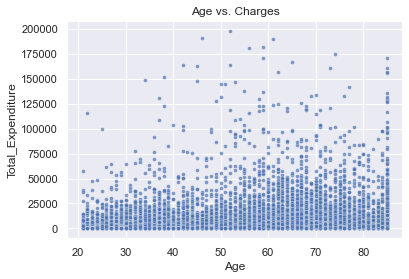

In [39]:
plt.title('Age vs. Charges')
sns.scatterplot(data=non_smoker_df, x='Age', y='Total_Expenditure', alpha=0.7, s=15);

Apart from a few exceptions, the points seem to form a line. 

In [40]:
model = LinearRegression()

In [41]:
#create X and Y data matrices
X = non_smoker_df.drop(columns=["Total_Expenditure", "Tobacco_Use"], axis=1)
y = non_smoker_df.Total_Expenditure
print('X.shape :', X.shape)
print('y.shape :', y.shape)


X.shape : (12608, 15)
y.shape : (12608,)


In [42]:
#Perform 80/20 split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [43]:
#Data dimention
X_train.shape, y_train.shape

((10086, 15), (10086,))

In [44]:
X_test.shape, y_test.shape

((2522, 15), (2522,))

In [45]:
from sklearn import linear_model
#Compute performance of the model
from sklearn.metrics import mean_squared_error, r2_score

In [46]:
#Build Linear regression
model = LinearRegression()

In [47]:
#build training model
model.fit(X_train, y_train)

LinearRegression()

In [48]:
#Apply trained model to make prediction (on test set)
y_pred = model.predict(X_test)

In [49]:
### Prediction results
print('Coefficients:', model.coef_)
print('Intercept:', model.intercept_)
print('Mean squared error (MSE): %.2f'
      % mean_squared_error(y_test, y_pred))
print('Coefficient of determination (R^2): %.2f'
      % r2_score(y_test, y_pred))

Coefficients: [-1.55523243e+00 -6.18649414e+00 -2.47819057e-01  1.88905412e+01
  3.45821617e+00  2.35732175e+00 -2.85406994e+00  3.56532154e+00
  1.35009237e-04  1.00061239e+00  9.99041027e-01  9.99168199e-01
  9.99631131e-01  1.00027630e+00  1.00313841e+00]
Intercept: -92.01399890869743
Mean squared error (MSE): 323924.07
Coefficient of determination (R^2): 1.00


In [50]:
#String Formatting
r2_score(y_test, y_pred)

0.9985731583541225

In [51]:
y_test

ID
2326730     6441
2292191    10806
2297391     1845
2324827        0
2296318     1991
           ...  
2296631    11986
2298750     2662
2293320     5678
2326153     6342
2296866      929
Name: Total_Expenditure, Length: 2522, dtype: int64

In [52]:
np.array(y_test)

array([ 6441, 10806,  1845, ...,  5678,  6342,   929])

In [53]:
y_pred

array([ 6481.92580677, 10850.67427263,  1913.15354312, ...,
        5752.93727142,  6392.73543301,   936.19608167])

<AxesSubplot:xlabel='Total_Expenditure'>

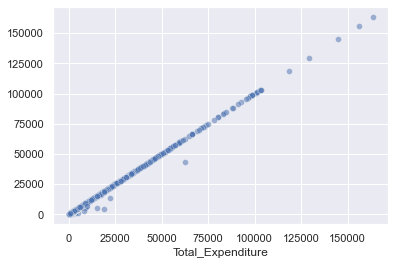

In [54]:
#Making the scatter plot
sns.scatterplot(y_test, y_pred, alpha=0.5)

In [55]:
#Testing prediction
data = {"age":20, "sex":1, "bmi":20, "children":5, "region": 2}
index=[0]
cust_df=pd.DataFrame(data, index)
cust_df

,age,sex,bmi,children,region
0,20,1,20,5,2


In [56]:
cost_prediction= model.predict(cust_df)
print("The medical insurance cost fo the new customer is: ", cost_prediction)

ValueError: X has 5 features, but LinearRegression is expecting 15 features as input.

## Khaing: Model

In [ ]:
# add color array to set_palette
# function of seaborn
sns.set_palette(my_colors)

In [ ]:
smoker_df = df_healthcare[df_healthcare.Tobacco_Use == 3]
smoker_df

In [ ]:
plt.subplots(1,1,figsize=(15,8))
plt.title('Charges vs Smoker')
sns.boxplot(x='Tobacco_Use', y='Total_Expenditure', data= df_healthcare, palette= "Blues")
plt.show()

In [ ]:
plt.subplots(1,1,figsize=(20,8))
plt.title('Charges vs Region vs Smoker')
sns.boxplot(x='Region', y='Total_Expenditure', hue='Tobacco_Use', data=df_healthcare, palette="Blues")

In [ ]:
# Preprocessing of data

In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
#Data pre-processing
#encoding the categorical features
# sex 0 or 1
label = LabelEncoder()
label.fit(insurance_df.sex.drop_duplicates())
insurance_df.sex = label.transform(insurance_df.sex)
# smoker or not
label.fit(insurance_df.smoker.drop_duplicates())
insurance_df.smoker = label.transform(insurance_df.smoker)
#region, each region has a number
label.fit(insurance_df.region.drop_duplicates())
insurance_df.region = label.transform(insurance_df.region)

insurance_df

In [ ]:
# Data standardlization 

In [ ]:
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()

df_healthcare[['Age', 'BMI']]=sc.fit_transform(df_healthcare[['Age', 'BMI']])

df_healthcare.head()

In [ ]:
# Training Data and validation

In [ ]:
from sklearn.model_selection import train_test_split,cross_val_score

x=df_healthcare.drop(['Total_Expenditure'], axis='columns')
y=np.log(df_healthcare['Total_Expenditure'])

x_train, x_test, y_train, y_test=train_test_split(x,y,test_size=0.25, random_state=11)

x_train.shape, x_test.shape

In [ ]:
len(x_test), len(x_train), len(df_healthcare)

In [ ]:
# Select the best model ( Train and Test the model) 

In [ ]:
# Linear Regression

In [ ]:
from sklearn.model_selection import train_test_split as holdout
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [ ]:
x = df_healthcare.drop(['Total_Expenditure'], axis = 1)
y = df_healthcare['Total_Expenditure']
x_train, x_test, y_train, y_test = holdout(x, y, test_size=0.2, random_state=0)
Lin_reg = LinearRegression()
Lin_reg.fit(x_train, y_train)
print(Lin_reg.intercept_)
print(Lin_reg.coef_)
print(Lin_reg.score(x_test, y_test))
print(Lin_reg.score(x_train, y_train))

In [ ]:
# Ridge Regression

In [ ]:
from sklearn.linear_model import Ridge
Ridge = Ridge(alpha=0.5)
Ridge.fit(x_train, y_train)
print(Ridge.intercept_)
print(Ridge.coef_)
print(Ridge.score(x_test, y_test))
print(Ridge.score(x_train, y_train))

In [ ]:
# Lasso Regression

In [ ]:
from sklearn.linear_model import Lasso
Lasso = Lasso(alpha=0.2, fit_intercept=True, normalize=False, precompute=False, max_iter=1000,
              tol=0.0001, warm_start=False, positive=False, random_state=None, selection='cyclic')
Lasso.fit(x_train, y_train)
print(Lasso.intercept_)
print(Lasso.coef_)
print(Lasso.score(x_test, y_test))
print(Lasso.score(x_train, y_train))

In [ ]:
# Problem ******* 

In [ ]:
def train_model(model):
    return model.fit(x_train, y_train)

models={'Linear Regression': Lin_reg,
        'Ridge Regression': Ridge,
        'Lasso Regression': Lasso}

for model in models.values():
    train_model(model)

In [ ]:
for name, model in models.items():
    print(model,f'R2 score {model.score(x_test,y_test)}')

In [ ]:
for name, model in models.items():
    print(model,f'R2 score {model.score(x_train,y_train)}')

In [ ]:
Lin_reg.score(x_test, y_test), Lin_reg.score(x_train, y_train)

In [ ]:
# Cross Validation

In [ ]:
cross_val_score(Lin_reg,x_test,y_test,cv=10).mean()
mean_squared_error(y_test,Lin_reg.predict(x_test))
### problem ? prediction error number is very large.

In [ ]:
cross_val_score(Ridge,x_test,y_test,cv=10).mean()

In [ ]:
cross_val_score(Lasso,x_test,y_test,cv=10).mean()

In [ ]:
from sklearn.metrics import mean_squared_error

In [ ]:
print(f'Train MSE {mean_squared_error(y_train,Lin_reg.predict(x_train))}')
print(f'Test MSE {mean_squared_error(y_test,Lin_reg.predict(x_test))}')

In [ ]:
# Lin_reg.predict(x_test) (prediction has a problem ?)

In [ ]:
test=pd.DataFrame({'True values': np.exp(y_test),
                   'Linear Regression Predictions': np.exp(Lin_reg.predict(x_test)),
                   'Ridge Regression Predictions': np.exp(Ridge.predict(x_test)),
                   'Lasso Regression Predictions': np.exp(Lasso.predict(x_test))})

In [ ]:
# Linear Regression vs Ridge Regression vs Lasso Regression

In [ ]:
fig,(ax_1,ax_2,ax_3)=plt.subplots(1,3,figsize=(25,8))

ax_1.set_title('Linear Regression')
sns.scatterplot(x='True values',y='Linear Regression Predictions',data=test,ax=ax_1,color='c')
sns.lineplot(x='True values',y='True values',data=test,ax=ax_1,color='c')

ax_2.set_title('Ridge Regression')
sns.scatterplot(x='True values',y='Ridge Regression Predictions',data=test,ax=ax_2,color='r')
sns.lineplot(x='True values',y='True values',data=test,ax=ax_2,color='r')

ax_3.set_title('Lasso Regression')
sns.scatterplot(x='True values',y='Lasso Regression Predictions',data=test,ax=ax_3,color='lightgreen')
sns.lineplot(x='True values',y='True values',data=test,ax=ax_3,color='lightgreen')

plt.show()

In [ ]:
test[:50]

In [ ]:
# Conclusion 

# After compare between three different regression method , we can see linear regression only has a smaller squared error.   
# Compared to Ridge regression and lasso regression, only Linear regression can provide very good predictions in general.

## Stacking Models

In [ ]:
X = df_healthcare.drop("Total_Expenditure", axis=1)
X

In [ ]:
y = df_healthcare["Total_Expenditure"].copy()
y

In [ ]:
# Remove low variance features
from sklearn.feature_selection import VarianceThreshold

selection = VarianceThreshold(threshold=(0.1))    
X = selection.fit_transform(X)
X.shape

In [ ]:
# Data splitting
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

In [ ]:
X_train.shape, X_test.shape

In [ ]:
#Build Classification models

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import f1_score

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
from sklearn import preprocessing
from sklearn import utils

#convert y values to categorical values
lab = preprocessing.LabelEncoder()
y_transformed = lab.fit_transform(y)

#view transformed values
print(y_transformed)

### K Nearest neighbors

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(5) # Define classifier
knn.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = knn.predict(X_train)
y_test_pred = knn.predict(X_test)

# Training set performance
knn_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
knn_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
knn_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
knn_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
knn_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
knn_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % knn_train_accuracy)
print('- MCC: %s' % knn_train_mcc)
print('- F1 score: %s' % knn_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % knn_test_accuracy)
print('- MCC: %s' % knn_test_mcc)
print('- F1 score: %s' % knn_test_f1)

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, random_state=0) # Define classifier
rf.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Training set performance
rf_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
rf_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
rf_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
rf_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
rf_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
rf_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % rf_train_accuracy)
print('- MCC: %s' % rf_train_mcc)
print('- F1 score: %s' % rf_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % rf_test_accuracy)
print('- MCC: %s' % rf_test_mcc)
print('- F1 score: %s' % rf_test_f1)

### Neural network

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(alpha=1, max_iter=1000)
mlp.fit(X_train, y_train)

# Make predictions
y_train_pred = mlp.predict(X_train)
y_test_pred = mlp.predict(X_test)

# Training set performance
mlp_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
mlp_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
mlp_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
mlp_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
mlp_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
mlp_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % mlp_train_accuracy)
print('- MCC: %s' % mlp_train_mcc)
print('- F1 score: %s' % mlp_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % mlp_test_accuracy)
print('- MCC: %s' % mlp_test_mcc)
print('- F1 score: %s' % mlp_test_f1)

### Support vector machine (Radial basis function kernel)

In [ ]:
from sklearn.svm import SVC

svm_rbf = SVC(gamma=2, C=1)
svm_rbf.fit(X_train, y_train)

# Make predictions
y_train_pred = svm_rbf.predict(X_train)
y_test_pred = svm_rbf.predict(X_test)

# Training set performance
svm_rbf_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
svm_rbf_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
svm_rbf_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
svm_rbf_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
svm_rbf_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
svm_rbf_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % svm_rbf_train_accuracy)
print('- MCC: %s' % svm_rbf_train_mcc)
print('- F1 score: %s' % svm_rbf_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % svm_rbf_test_accuracy)
print('- MCC: %s' % svm_rbf_test_mcc)
print('- F1 score: %s' % svm_rbf_test_f1)

### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(max_depth=15) # Define classifier
dt.fit(X_train, y_train) # Train model

# Make predictions
y_train_pred = dt.predict(X_train)
y_test_pred = dt.predict(X_test)

# Training set performance
dt_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
dt_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
dt_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set performance
dt_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
dt_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
dt_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % dt_train_accuracy)
print('- MCC: %s' % dt_train_mcc)
print('- F1 score: %s' % dt_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % dt_test_accuracy)
print('- MCC: %s' % dt_test_mcc)
print('- F1 score: %s' % dt_test_f1)

### Build Stacked model

In [ ]:
# Define estimators
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

estimator_list = [
    ('knn',knn),
    ('svm_rbf',svm_rbf),
    ('dt',dt),
    ('rf',rf),
    ('mlp',mlp) ]

# Build stack model
stack_model = StackingClassifier(
    estimators=estimator_list, final_estimator=LogisticRegression()
)

# Train stacked model
stack_model.fit(X_train, y_train)

# Make predictions
y_train_pred = stack_model.predict(X_train)
y_test_pred = stack_model.predict(X_test)

# Training set model performance
stack_model_train_accuracy = accuracy_score(y_train, y_train_pred) # Calculate Accuracy
stack_model_train_mcc = matthews_corrcoef(y_train, y_train_pred) # Calculate MCC
stack_model_train_f1 = f1_score(y_train, y_train_pred, average='weighted') # Calculate F1-score

# Test set model performance
stack_model_test_accuracy = accuracy_score(y_test, y_test_pred) # Calculate Accuracy
stack_model_test_mcc = matthews_corrcoef(y_test, y_test_pred) # Calculate MCC
stack_model_test_f1 = f1_score(y_test, y_test_pred, average='weighted') # Calculate F1-score

print('Model performance for Training set')
print('- Accuracy: %s' % stack_model_train_accuracy)
print('- MCC: %s' % stack_model_train_mcc)
print('- F1 score: %s' % stack_model_train_f1)
print('----------------------------------')
print('Model performance for Test set')
print('- Accuracy: %s' % stack_model_test_accuracy)
print('- MCC: %s' % stack_model_test_mcc)
print('- F1 score: %s' % stack_model_test_f1)

### Results

In [ ]:
acc_train_list = {'knn':knn_train_accuracy,
'svm_rbf': svm_rbf_train_accuracy,
'dt': dt_train_accuracy,
'rf': rf_train_accuracy,
'mlp': mlp_train_accuracy,
'stack': stack_model_train_accuracy}

mcc_train_list = {'knn':knn_train_mcc,
'svm_rbf': svm_rbf_train_mcc,
'dt': dt_train_mcc,
'rf': rf_train_mcc,
'mlp': mlp_train_mcc,
'stack': stack_model_train_mcc}

f1_train_list = {'knn':knn_train_f1,
'svm_rbf': svm_rbf_train_f1,
'dt': dt_train_f1,
'rf': rf_train_f1,
'mlp': mlp_train_f1,
'stack': stack_model_train_f1}

In [ ]:
mcc_train_list

In [ ]:
acc_df = pd.DataFrame.from_dict(acc_train_list, orient='index', columns=['Accuracy'])
mcc_df = pd.DataFrame.from_dict(mcc_train_list, orient='index', columns=['MCC'])
f1_df = pd.DataFrame.from_dict(f1_train_list, orient='index', columns=['F1'])
df = pd.concat([acc_df, mcc_df, f1_df], axis=1)
df